# HW5 Canonical Correlation

In [1]:
### load module

import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from scipy import stats
from datetime import datetime
import matplotlib.dates as mdates
from scipy.linalg import sqrtm, inv, det
from scipy.stats import pearsonr

## Open and Check Data

In [2]:
### open and check the data

df_prec_east = xr.open_dataset('../data/ERA5_Precipitation_East.nc')
print(df_prec_east.tp.shape)
df_prec_west = xr.open_dataset('../data/ERA5_Precipitation_West.nc')
print(df_prec_west.tp.shape)
df_smrt_east = xr.open_dataset('../data/ERA5_SMroot_EastSESA.nc')
print(df_smrt_east.SMroot.shape)
df_smrt_west = xr.open_dataset('../data/ERA5_SMroot_WestSESA.nc')
print(df_smrt_west.SMroot.shape)

(996,)
(996,)
(996,)
(996,)


### 1. Plot timeseries of precipitation and soil moisture

* Lag the precipitation time series by two months and plot the soil moisture and precipitation

In [3]:
### create datetiem for the data

range_date = pd.date_range(start ='1/1/1940', end ='12/1/2022', 
                                                   freq ='MS')
print(range_date)

DatetimeIndex(['1940-01-01', '1940-02-01', '1940-03-01', '1940-04-01',
               '1940-05-01', '1940-06-01', '1940-07-01', '1940-08-01',
               '1940-09-01', '1940-10-01',
               ...
               '2022-03-01', '2022-04-01', '2022-05-01', '2022-06-01',
               '2022-07-01', '2022-08-01', '2022-09-01', '2022-10-01',
               '2022-11-01', '2022-12-01'],
              dtype='datetime64[ns]', length=996, freq='MS')


In [4]:
### create dataframe from precipitation
# create datetime column
df_prec = pd.DataFrame(range_date, columns=['date'])

# create precipitation dataframe
df_prec['prec_east']=np.array(df_prec_east.tp)
df_prec['prec_west']=np.array(df_prec_west.tp)
print(df_prec)

# create soil moisture dataframe
df_smrt = pd.DataFrame(range_date, columns=['date'])
df_smrt['smrt_east']=np.array(df_smrt_east.SMroot)
df_smrt['smrt_west']=np.array(df_smrt_west.SMroot)
print(df_smrt)

          date  prec_east  prec_west
0   1940-01-01   0.006222   0.005430
1   1940-02-01   0.004962   0.002470
2   1940-03-01   0.003403   0.003360
3   1940-04-01   0.003002   0.005992
4   1940-05-01   0.006388   0.007123
..         ...        ...        ...
991 2022-08-01   0.003511   0.001788
992 2022-09-01   0.003856   0.001953
993 2022-10-01   0.005080   0.003404
994 2022-11-01   0.003763   0.001967
995 2022-12-01   0.003918   0.001412

[996 rows x 3 columns]
          date  smrt_east  smrt_west
0   1940-01-01   0.367937   0.289799
1   1940-02-01   0.370490   0.290687
2   1940-03-01   0.349336   0.319614
3   1940-04-01   0.381649   0.340492
4   1940-05-01   0.435383   0.339867
..         ...        ...        ...
991 2022-08-01   0.400079   0.198590
992 2022-09-01   0.385845   0.192465
993 2022-10-01   0.380875   0.198083
994 2022-11-01   0.348521   0.208080
995 2022-12-01   0.325136   0.209254

[996 rows x 3 columns]


In [5]:
### create a new dataframe for lagged precipitation and soilmoisture 
df_prec_lag = df_prec.iloc[2:]
print(df_prec_lag)
df_smrt_lag = df_smrt.iloc[:-2]
print(df_smrt_lag)

          date  prec_east  prec_west
2   1940-03-01   0.003403   0.003360
3   1940-04-01   0.003002   0.005992
4   1940-05-01   0.006388   0.007123
5   1940-06-01   0.004857   0.007150
6   1940-07-01   0.005664   0.003428
..         ...        ...        ...
991 2022-08-01   0.003511   0.001788
992 2022-09-01   0.003856   0.001953
993 2022-10-01   0.005080   0.003404
994 2022-11-01   0.003763   0.001967
995 2022-12-01   0.003918   0.001412

[994 rows x 3 columns]
          date  smrt_east  smrt_west
0   1940-01-01   0.367937   0.289799
1   1940-02-01   0.370490   0.290687
2   1940-03-01   0.349336   0.319614
3   1940-04-01   0.381649   0.340492
4   1940-05-01   0.435383   0.339867
..         ...        ...        ...
989 2022-06-01   0.411986   0.217900
990 2022-07-01   0.399329   0.206583
991 2022-08-01   0.400079   0.198590
992 2022-09-01   0.385845   0.192465
993 2022-10-01   0.380875   0.198083

[994 rows x 3 columns]


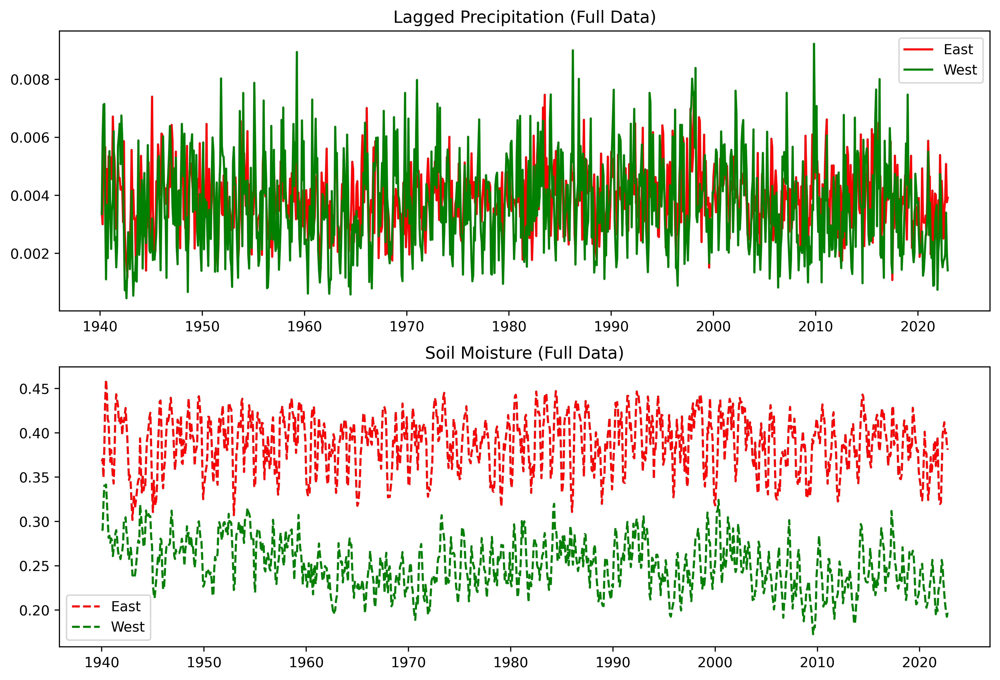

In [13]:
### plot time series of lagged precipitation and soil moisture

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=500)
(ax1, ax2) = axs

ax1.plot(df_prec_lag['date'], df_prec_lag['prec_east'], color='red', label='East')
ax1.plot(df_prec_lag['date'], df_prec_lag['prec_west'], color='green', label='West')
ax1.set_title('Lagged Precipitation (Full Data)')
ax1.legend()

ax2.plot(df_smrt_lag['date'], df_smrt_lag['smrt_east'], color='red', linestyle='--', label='East')
ax2.plot(df_smrt_lag['date'], df_smrt_lag['smrt_west'], color='green', linestyle='--', label='West')
ax2.set_title('Soil Moisture (Full Data)')
ax2.legend()

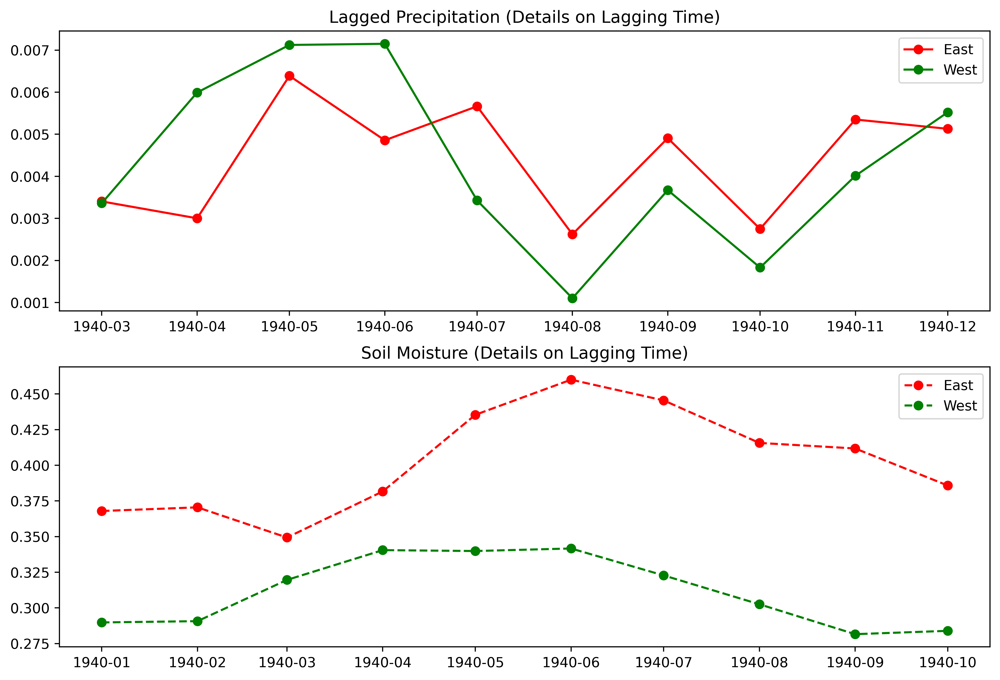

In [14]:
### plot time series of lagged precipitation and soil moisture - in detail

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=500)
(ax1, ax2) = axs

ax1.plot(df_prec_lag['date'][0:10], df_prec_lag['prec_east'][0:10], color='red', marker = 'o', label='East')
ax1.plot(df_prec_lag['date'][0:10], df_prec_lag['prec_west'][0:10], color='green', marker = 'o', label='West')
ax1.set_title('Lagged Precipitation (Details on Lagging Time)')
ax1.legend()

ax2.plot(df_smrt_lag['date'][0:10], df_smrt_lag['smrt_east'][0:10], color='red', marker = 'o', linestyle='--', label='East')
ax2.plot(df_smrt_lag['date'][0:10], df_smrt_lag['smrt_west'][0:10], color='green', marker = 'o', linestyle='--', label='West')
ax2.set_title('Soil Moisture (Details on Lagging Time)')
ax2.legend()

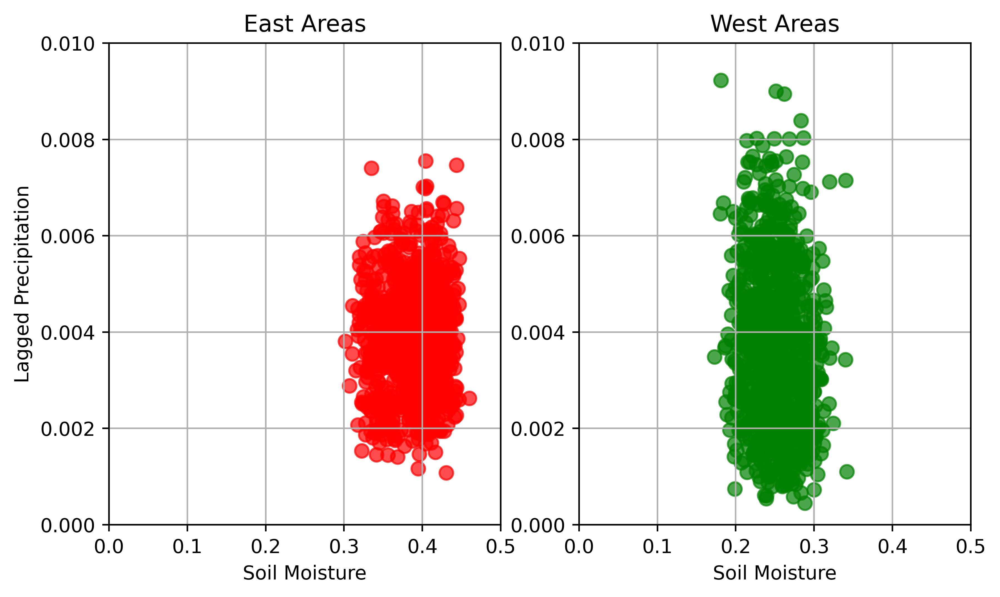

In [7]:
### scatter plot of lagged precip and soil moisture for each area

fig, axs = plt.subplots(1, 2, figsize=(8, 4.5), dpi=500)
(ax1, ax2) = axs

ax1.scatter(df_smrt_lag['smrt_east'], df_prec_lag['prec_east'], 
            color='red', marker='o', s=50, alpha=0.7)
ax1.set_xlim(0, 0.5)
ax1.set_ylim(0, 0.01)
ax1.set_title('East Areas')
ax1.set_ylabel('Lagged Precipitation')
ax1.set_xlabel('Soil Moisture')
ax1.grid()

ax2.scatter(df_smrt_lag['smrt_west'], df_prec_lag['prec_west'], 
            color='green', marker='o', s=50, alpha=0.7)
ax2.set_xlim(0, 0.5)
ax2.set_ylim(0, 0.01)
ax2.set_title('West Areas')
ax2.set_xlabel('Soil Moisture')
ax2.grid()


### 2. Standardized the soil moisture and precip data

In [17]:
### standardized the precip. data
stdz_prec_east = (df_prec_lag['prec_east'] - df_prec_lag['prec_east'].mean()) / df_prec_lag['prec_east'].std()
stdz_prec_west = (df_prec_lag['prec_west'] - df_prec_lag['prec_west'].mean()) / df_prec_lag['prec_west'].std()
stdz_smrt_east = (df_smrt_lag['smrt_east'] - df_smrt_lag['smrt_east'].mean()) / df_smrt_lag['smrt_east'].std()
stdz_smrt_west = (df_smrt_lag['smrt_west'] - df_smrt_lag['smrt_west'].mean()) / df_smrt_lag['smrt_west'].std()

### create array for standardized variable
a = np.array(stdz_prec_east)
b = np.array(stdz_prec_west)
c = np.array(stdz_smrt_east)
d = np.array(stdz_smrt_west)
df_stdz = np.vstack((d, c, b, a)) #w e
print(df_stdz)

### to ease the calculation, convert to the same shape as example
dfs = np.transpose(df_stdz) # the transpose 
print(dfs)
print('Standardized Data')
print(np.round(dfs, 2))
#print(dfs.shape)

[[ 1.3515636   1.3825283   2.3906875  ... -1.8272238  -2.0406787
  -1.8448957 ]
 [-0.64008474 -0.55902916 -1.2306597  ...  0.3804189  -0.0715111
  -0.22931696]
 [-0.19892561  1.4163772   2.1103325  ... -0.17205319 -1.0541304
  -1.3948795 ]
 [-0.44298765 -0.80310476  2.2377944  ...  1.0632991  -0.11983164
   0.0194656 ]]
[[ 1.3515636  -0.64008474 -0.19892561 -0.44298765]
 [ 1.3825283  -0.55902916  1.4163772  -0.80310476]
 [ 2.3906875  -1.2306597   2.1103325   2.2377944 ]
 ...
 [-1.8272238   0.3804189  -0.17205319  1.0632991 ]
 [-2.0406787  -0.0715111  -1.0541304  -0.11983164]
 [-1.8448957  -0.22931696 -1.3948795   0.0194656 ]]
Standardized Data
[[ 1.35 -0.64 -0.2  -0.44]
 [ 1.38 -0.56  1.42 -0.8 ]
 [ 2.39 -1.23  2.11  2.24]
 ...
 [-1.83  0.38 -0.17  1.06]
 [-2.04 -0.07 -1.05 -0.12]
 [-1.84 -0.23 -1.39  0.02]]


### 3. Perform CCA Analysis Manually
* Use X for standardized moisture data and Y for standardized precip data

In [25]:
### Perform Manual CCA

# calculate mean for every column
mn_df = np.mean(dfs, 0, keepdims=True)
print(mn_df)

# calculate anomalies
dfp = dfs - mn_df
print(dfp)

# define n
n = dfp.shape[0]
print("\nn =", n)

# calculate covariance matrix
S = (1/(n-1))* np.dot(np.transpose(dfp), dfp)
print('Covariance Matrix (S)')
print(np.round(S, 2))

#Extract individual covariance matrices, inverse and reciprocal square root
Sxx  = S[:2, :2]
Syy =  S[-2:, -2:]
Syx =  S[-2:,:2]
Sxy =  S[:2,-2:]
Sxxinv = np.linalg.inv(Sxx)
Syyinv = np.linalg.inv(Syy)

Sxx_5 = inv(sqrtm(Sxx))
Syy_5 = inv(sqrtm(Syy))

print("\nSxx")
print (np.round(Sxx, 2))
print("\nSyy")
print (np.round(Syy, 2))
print("\nSyx")
print (np.round(Syx, 2))
print("\nSxy")
print (np.round(Sxy, 2))
print("\nSxx_5")
print (np.round(Sxx_5, 2))
print("\nSyy_5")
print(np.round(Syy_5, 2))

[[-2.1260989e-06 -1.0841569e-06 -3.6458374e-07  2.4561430e-07]]
[[ 1.3515657  -0.6400837  -0.19892526 -0.4429879 ]
 [ 1.3825305  -0.5590281   1.4163775  -0.803105  ]
 [ 2.3906896  -1.2306587   2.110333    2.2377942 ]
 ...
 [-1.8272216   0.38041997 -0.17205283  1.0632988 ]
 [-2.0406766  -0.07151002 -1.0541301  -0.11983188]
 [-1.8448936  -0.22931588 -1.3948791   0.01946535]]

n = 994
Covariance Matrix (S)
[[ 1.    0.29 -0.14 -0.04]
 [ 0.29  1.    0.01  0.03]
 [-0.14  0.01  1.    0.49]
 [-0.04  0.03  0.49  1.  ]]

Sxx
[[1.   0.29]
 [0.29 1.  ]]

Syy
[[1.   0.49]
 [0.49 1.  ]]

Syx
[[-0.14  0.01]
 [-0.04  0.03]]

Sxy
[[-0.14 -0.04]
 [ 0.01  0.03]]

Sxx_5
[[ 1.03 -0.16]
 [-0.16  1.03]]

Syy_5
[[ 1.11 -0.29]
 [-0.29  1.11]]


### 4. Report the canonical vectors `a` and `b`

In [33]:
### perform CCA Analysis manually
M = np.dot(np.dot(np.dot(np.dot(Sxx_5,Sxy),Syyinv),Syx),Sxx_5)

# calculate the eigenvalues (canonical correlations) and eigenvectors
eigenvalues1, eigenvectors1 = np.linalg.eig(M)

#print('Eigenvalues, eigenvectors for M')
print("\nMatrix M")
print(np.round(M, 3))
print("\nEigenvalues Matrix M")
print(np.round(eigenvalues1, 3))
print("\nEigenvectors Matrix M")
print(np.round(eigenvectors1, 2))

### just for checking 
#eigenvectors1 = -1 * eigenvectors1

N = np.dot(np.dot(np.dot(np.dot(Syy_5,Syx),Sxxinv),Sxy),Syy_5)
# calculate the eigenvalues (canonical correlations) and eigenvectors
eigenvalues2, eigenvectors2 = np.linalg.eig(N)

#rint("\nEigenvalues, eigenvectors for N")
print("\nMatrix N")
print(np.round(N, 3))
print("\nEigenvalues Matrix N")
print(np.round(eigenvalues2,3))
print("\nEigenvectors Matrix N")
print(np.round(eigenvectors2,2))

#Now we calculate the canonical vectors a and b
a = np.dot(Sxx_5,eigenvectors1)
print("\nCanonical vector a")
print(np.round(a,2))

b = np.dot(Syy_5,eigenvectors2)
print("\nCanonical vector b")
print(np.round(b,2))


Matrix M
[[ 0.023 -0.004]
 [-0.004  0.002]]

Eigenvalues Matrix M
[0.024 0.001]

Eigenvectors Matrix M
[[ 0.99  0.17]
 [-0.17  0.99]]

Matrix N
[[0.024 0.002]
 [0.002 0.001]]

Eigenvalues Matrix N
[0.024 0.001]

Eigenvectors Matrix N
[[ 0.99 -0.1 ]
 [ 0.1   0.99]]

Canonical vector a
[[ 1.05  0.02]
 [-0.33  0.99]]

Canonical vector b
[[ 1.07 -0.4 ]
 [-0.17  1.13]]


In [36]:
### calculate CCA from the canonical vector a and b

# select the X and Y data used stadnardized data
X = dfp[:,:2] #west
Y = dfp[:,2:] #east
print('X')
print(np.round(X,2))
print("\nY")
print(np.round(Y, 2))

# select the a and b 
a1 = a[:,:1]
b1 = b[:,:1] # minus comes from
a2 = a[:,1:]
b2 = b[:,1:]

#print("\na1", a1)
#print("\nb1", b1)
#print("\na2", a2)
#print("\nb2", b2)

# calculate vector V and W
V1 = np.dot(np.transpose(a1),np.transpose(X))
#print("\nV1")
#print(np.round(V1, 2))

W1 = np.dot(np.transpose(b1),np.transpose(Y))
#print("\nW1")
#print(W1.shape)

V2 = np.dot(np.transpose(a2),np.transpose(X))
#print('V2')
#print(V2)

W2 = np.dot(np.transpose(b2),np.transpose(Y))
#print('W2')
#print(W2)
#print(X.shape)


X
[[ 1.35 -0.64]
 [ 1.38 -0.56]
 [ 2.39 -1.23]
 ...
 [-1.83  0.38]
 [-2.04 -0.07]
 [-1.84 -0.23]]

Y
[[-0.2  -0.44]
 [ 1.42 -0.8 ]
 [ 2.11  2.24]
 ...
 [-0.17  1.06]
 [-1.05 -0.12]
 [-1.39  0.02]]


### 5. Plot the canonical variate and the standardized data
* `V1` with `X`
* `W1` with `Y`

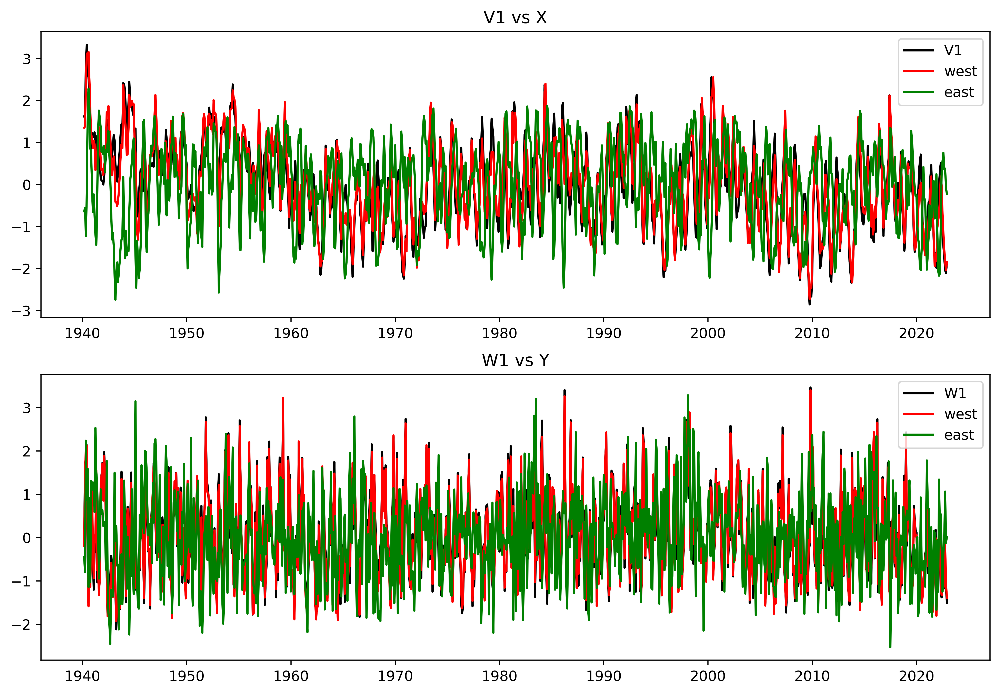

In [28]:
### plot canonial variate with standardized data 

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=500)
(ax1, ax3) = axs

ax1.plot(df_prec_lag['date'], V1[0,:], color='k', label='V1')
ax1.plot(df_prec_lag['date'],X[:,0], color='red', label='west')
ax1.plot(df_prec_lag['date'],X[:,1], color='green', label='east')
ax1.set_title('V1 vs X')
ax1.legend()

ax3.plot(df_prec_lag['date'],W1[0,:], color='k', label='W1')
ax3.plot(df_prec_lag['date'],Y[:,0], color='red', label='west')
ax3.plot(df_prec_lag['date'],Y[:,1], color='green', label='east')
ax3.set_title('W1 vs Y')
ax3.legend()

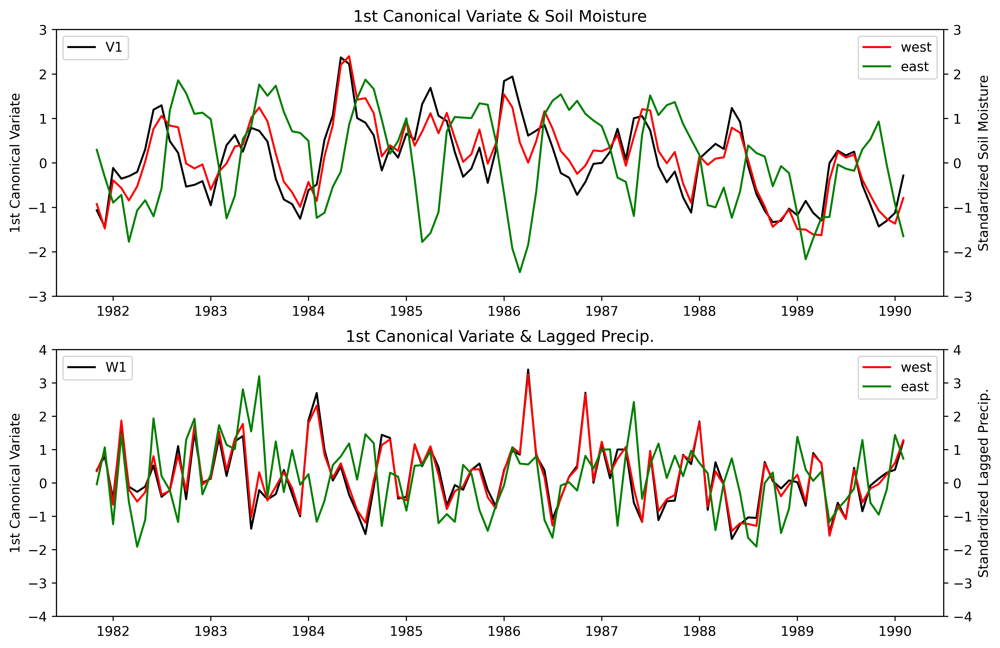

In [43]:
### plot canonial variate with standardized data 

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=500)
(ax1, ax3) = axs

ax2 = ax1.twinx()
ax1.plot(df_prec_lag['date'][500:600], V1[0,500:600], color='k', label='V1')
ax2.plot(df_prec_lag['date'][500:600],X[500:600,0], color='red', label='west')
ax2.plot(df_prec_lag['date'][500:600],X[500:600,1], color='green', label='east')
ax1.set_ylim(-3, 3)
ax2.set_ylim(-3, 3)
ax1.set_title('1st Canonical Variate & Soil Moisture')
ax1.set_ylabel('1st Canonical Variate')
ax2.set_ylabel('Standardized Soil Moisture')
ax1.legend(loc='upper left')
ax2.legend()

ax4 = ax3.twinx()
ax3.plot(df_prec_lag['date'][500:600],W1[0,500:600], color='k', label='W1')
ax4.plot(df_prec_lag['date'][500:600],Y[500:600,0], color='red', label='west')
ax4.plot(df_prec_lag['date'][500:600],Y[500:600,1], color='green', label='east')
ax3.set_ylim(-4, 4)
ax4.set_ylim(-4, 4)
ax3.set_title('1st Canonical Variate & Lagged Precip.')
ax3.set_ylabel('1st Canonical Variate')
ax4.set_ylabel('Standardized Lagged Precip.')
ax3.legend(loc='upper left')
ax4.legend()

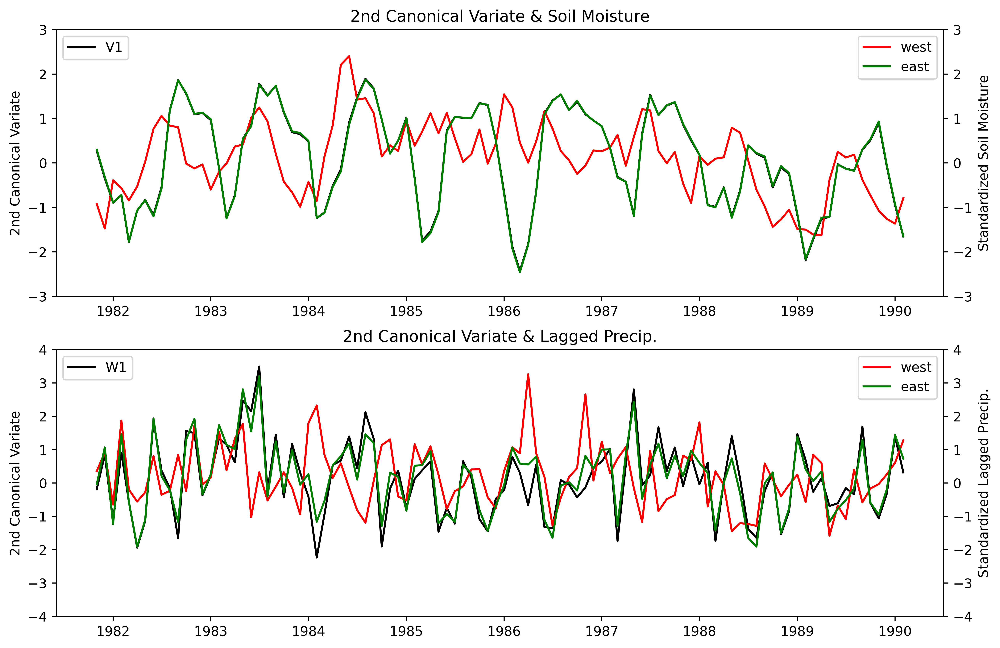

In [44]:
### plot canonial variate with standardized data 

fig, axs = plt.subplots(2, 1, figsize=(12, 8), dpi=500)
(ax1, ax3) = axs

ax2 = ax1.twinx()
ax1.plot(df_prec_lag['date'][500:600], V2[0,500:600], color='k', label='V1')
ax2.plot(df_prec_lag['date'][500:600],X[500:600,0], color='red', label='west')
ax2.plot(df_prec_lag['date'][500:600],X[500:600,1], color='green', label='east')
ax1.set_ylim(-3, 3)
ax2.set_ylim(-3, 3)
ax1.set_title('2nd Canonical Variate & Soil Moisture')
ax1.set_ylabel('2nd Canonical Variate')
ax2.set_ylabel('Standardized Soil Moisture')
ax1.legend(loc='upper left')
ax2.legend()

ax4 = ax3.twinx()
ax3.plot(df_prec_lag['date'][500:600],W2[0,500:600], color='k', label='W1')
ax4.plot(df_prec_lag['date'][500:600],Y[500:600,0], color='red', label='west')
ax4.plot(df_prec_lag['date'][500:600],Y[500:600,1], color='green', label='east')
ax3.set_ylim(-4, 4)
ax4.set_ylim(-4, 4)
ax3.set_title('2nd Canonical Variate & Lagged Precip.')
ax3.set_ylabel('2nd Canonical Variate')
ax4.set_ylabel('Standardized Lagged Precip.')
ax3.legend(loc='upper left')
ax4.legend()

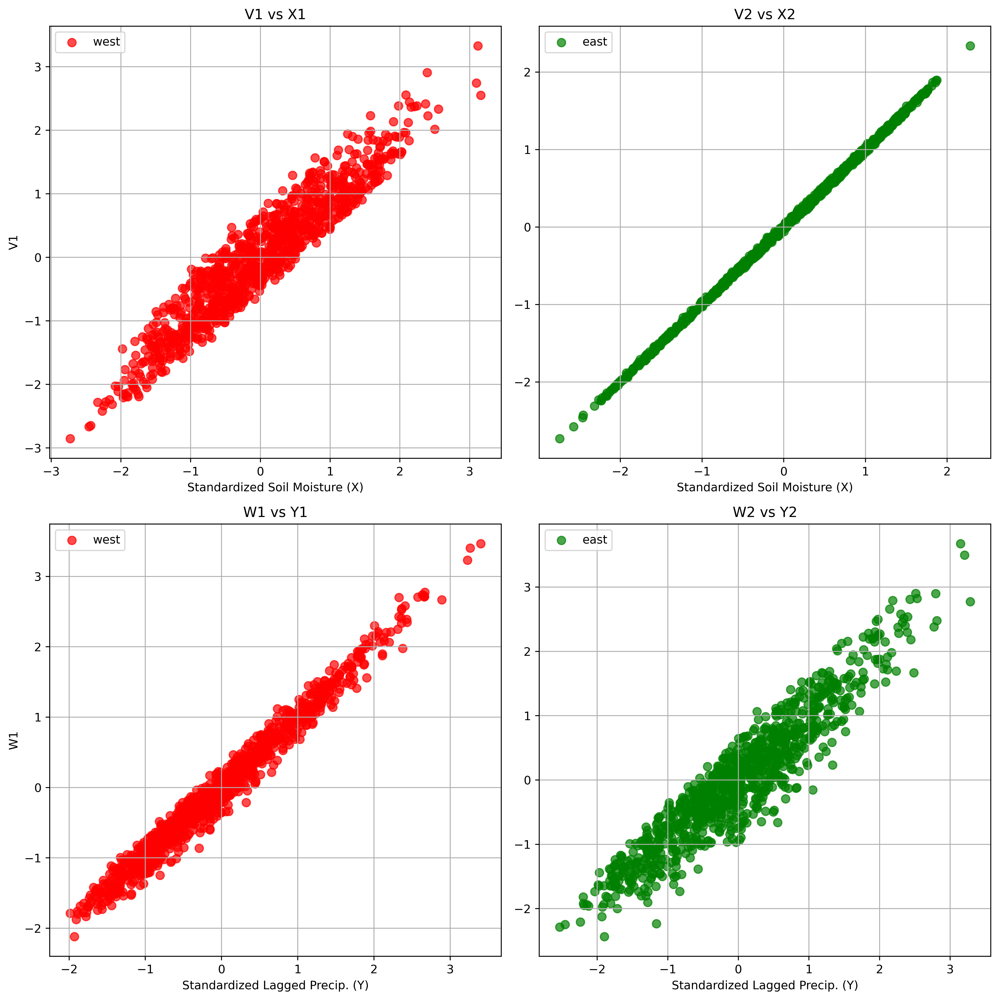

In [30]:
### scatter plot of canonical variates with standardized data

fig, axs = plt.subplots(2, 2, figsize=(12, 12), dpi=500)
(ax1, ax2), (ax3, ax4)= axs

ax1.scatter(X[:,0], V1[0,:], 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax1.set_ylabel('V1')
ax1.set_xlabel('Standardized Soil Moisture (X)')
ax1.set_title('V1 vs X1')
ax1.legend()
ax1.grid()

ax2.scatter(X[:,1], V2[0,:], 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax2.set_xlabel('Standardized Soil Moisture (X)')
ax2.set_title('V2 vs X2')
ax2.legend()
ax2.grid()

ax3.scatter(Y[:,0], W1[0,:], 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax3.set_ylabel('W1')
ax3.set_xlabel('Standardized Lagged Precip. (Y)')
ax3.set_title('W1 vs Y1')
ax3.legend()
ax3.grid()

ax4.scatter(Y[:,1], W2[0,:], 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax4.set_xlabel('Standardized Lagged Precip. (Y)')
ax4.set_title('W2 vs Y2')
ax4.legend()
ax4.grid()

fig.tight_layout()

### 6. Report the correlation of `V1` and `W1`

In [52]:
# calculate correlation coeef. 
cc1 = np.corrcoef(V1,W1)
print('Calculation by hand:')
print('Correlation Coefficient V1 and W1: %.3f' % cc1[0,1])
cc2 = np.corrcoef(V2,W2)
#print('Correlation Coefficient 2: %.3f' % cc2[0,1])

#The canonical correlations are the square root of the eigenvalues
cc_e = np.sqrt(eigenvalues1)
print("\nFirst Canonical Correlations from square root of Eigenvalues")
print(np.round(cc_e[0],3))

Calculation by hand:
Correlation Coefficient V1 and W1: -0.155

First Canonical Correlations from square root of Eigenvalues
0.155


Text(0.5, 0.98, 'Scatterplots of two pairs of canonical varietes')

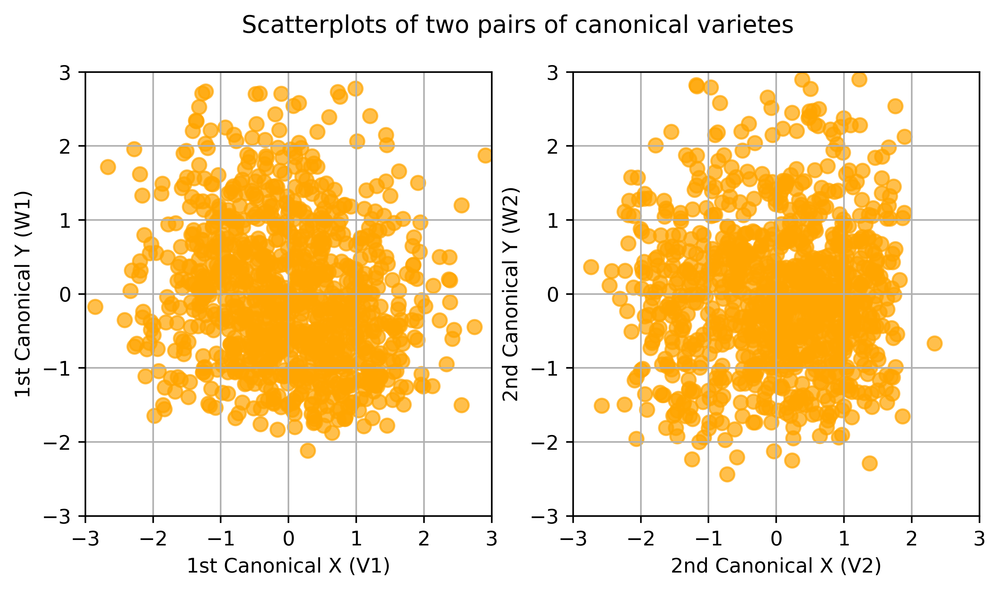

In [32]:
### try to see how variates of X and Y are related

fig, axs = plt.subplots(1, 2, figsize=(8, 4), dpi=500)
(ax1, ax2) = axs

ax1.scatter(V1, W1, 
            color='orange', marker='o', s=50, alpha=0.7)
ax1.set_ylim(-3,3)
ax1.set_xlim(-3,3)
ax1.set_ylabel('1st Canonical Y (W1)')
ax1.set_xlabel('1st Canonical X (V1)')
ax1.grid()

ax2.scatter(V2, W2, 
            color='orange', marker='o', s=50, alpha=0.7)
ax2.set_ylim(-3,3)
ax2.set_xlim(-3,3)
ax2.set_ylabel('2nd Canonical Y (W2)')
ax2.set_xlabel('2nd Canonical X (V2)')
ax2.grid()

fig.suptitle('Scatterplots of two pairs of canonical varietes')

### 7. Try to test the significance of correlation

In [55]:
# Calculate canonical correlation coefficient and p-value
corr_coeff1, p_value1 = pearsonr(V1[0], W1[0])
corr_coeff2, p_value2 = pearsonr(V2[0], W2[0])

# Display results
print('Correlation Coefficient V1, W1 (CC1): %.3f' % corr_coeff1)
formatted_number = "{:.2e}".format(p_value1)
print('p-value CC1:', formatted_number)

print("\nCorrelation Coefficient V2, W2 (CC2): %.3f" % corr_coeff2)
print('p-value CC2:', np.round(p_value2,2))

Correlation Coefficient V1, W1 (CC1): -0.155
p-value CC1: 9.49e-07

Correlation Coefficient V2, W2 (CC2): 0.029
p-value CC2: 0.36


### 8. Repeat the above steps but with `canned` method

In [57]:
### import module for canned method

from sklearn.cross_decomposition import CCA

In [59]:
# Create CCA model
cca = CCA(n_components=2)

# Fit the model to the data
cca.fit(X, Y)

# Transform the data to canonical variables
canonical_variates_X, canonical_variates_Y = cca.transform(X, Y)

# Get canonical vectors and canonical correlations
canonical_vectors_X = cca.x_loadings_
canonical_vectors_Y = cca.y_loadings_
canonical_correlations = [np.corrcoef(canonical_variates_X[:, i], 
                            canonical_variates_Y[:, i])[1][0] for i in range(2)]

# Display the results
print("Canonical Vectors (a):")
print(np.round(canonical_vectors_X,2))

print("\nCanonical Vectors (b):")
print(np.round(canonical_vectors_Y,2))

print("\nCanonical Variates (V):")
print(np.round(canonical_variates_X,2))

print("\nCanonical Variates (W):")
print(np.round(canonical_variates_Y,2))

print("\nCanonical Correlations:")
print(np.round(canonical_correlations,2))

Canonical Vectors (a):
[[ 1.04  0.3 ]
 [-0.02  0.95]]

Canonical Vectors (b):
[[-1.07  0.16]
 [-0.38  0.99]]

Canonical Variates (V):
[[ 1.48 -0.63]
 [ 1.49 -0.55]
 [ 2.65 -1.22]
 ...
 [-1.86  0.35]
 [-1.92 -0.12]
 [-1.69 -0.28]]

Canonical Variates (W):
[[ 0.13 -0.4 ]
 [-1.53 -1.4 ]
 [-1.72  1.61]
 ...
 [ 0.34  1.21]
 [ 1.02  0.27]
 [ 1.38  0.55]]

Canonical Correlations:
[0.15 0.03]


### 9. Plot the `canned` and manual method for `V1` and `W1`

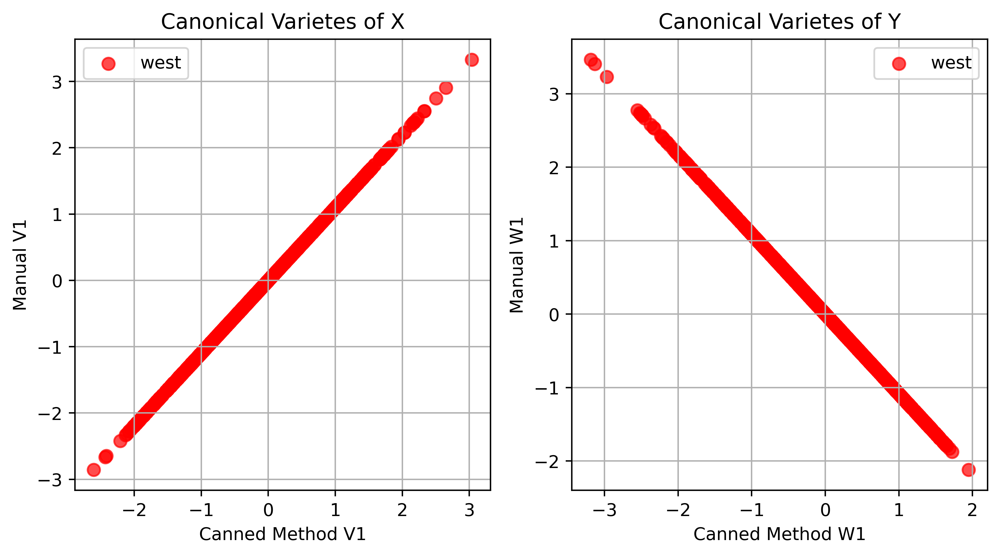

In [36]:
### scatter plot of canonical variates with standardized data

fig, axs = plt.subplots(1, 2, figsize=(8, 4.5), dpi=500)
(ax1, ax2) = axs

ax1.scatter(canonical_variates_X[:,0], V1, 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax1.set_ylabel('Manual V1')
ax1.set_xlabel('Canned Method V1')
ax1.set_title('Canonical Varietes of X')
ax1.legend()
ax1.grid()

ax2.scatter(canonical_variates_Y[:,0], W1, 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax2.set_ylabel('Manual W1')
ax2.set_xlabel('Canned Method W1')
ax2.set_title('Canonical Varietes of Y')
ax2.legend()
ax2.grid()

fig.tight_layout()

### 10. Plot the `canned` and manual method for `V2` and `W2`

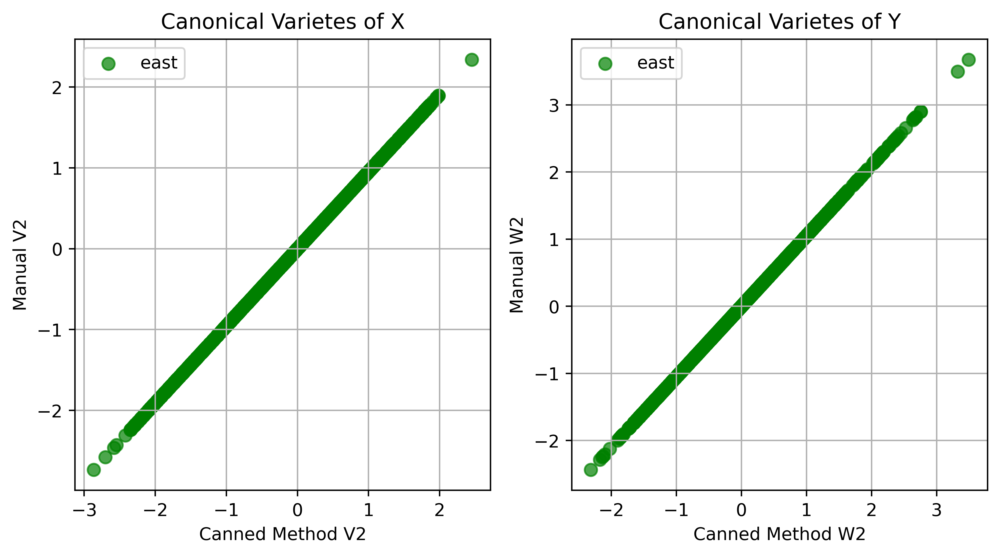

In [37]:
### scatter plot of canonical variates with standardized data

fig, axs = plt.subplots(1, 2, figsize=(8, 4.5), dpi=500)
(ax1, ax2) = axs

ax1.scatter(canonical_variates_X[:,1], V2, 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax1.set_ylabel('Manual V2')
ax1.set_xlabel('Canned Method V2')
ax1.set_title('Canonical Varietes of X')
ax1.legend()
ax1.grid()

ax2.scatter(canonical_variates_Y[:,1], W2, 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax2.set_ylabel('Manual W2')
ax2.set_xlabel('Canned Method W2')
ax2.set_title('Canonical Varietes of Y')
ax2.legend()
ax2.grid()

fig.tight_layout()

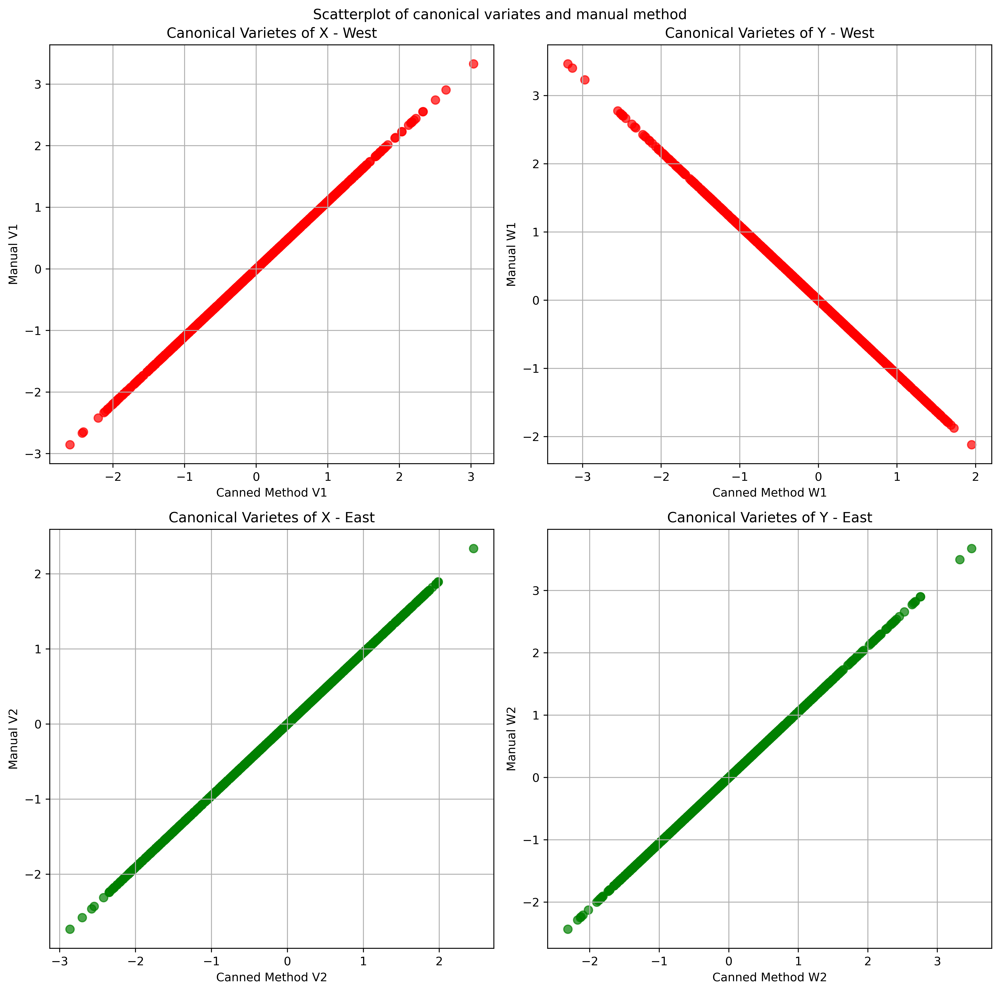

In [38]:
### scatter plot of canonical variates with standardized data

fig, axs = plt.subplots(2, 2, figsize=(12, 12), dpi=500)
(ax1, ax2), (ax3, ax4) = axs

ax1.scatter(canonical_variates_X[:,0], V1, 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax1.set_xlabel('Canned Method V1')
ax1.set_ylabel('Manual V1')
ax1.set_title('Canonical Varietes of X - West')
ax1.grid()

ax2.scatter(canonical_variates_Y[:,0], W1, 
            color='red', marker='o', s=50, alpha=0.7, label='west')
ax2.set_xlabel('Canned Method W1')
ax2.set_ylabel('Manual W1')
ax2.set_title('Canonical Varietes of Y - West')
ax2.grid()

ax3.scatter(canonical_variates_X[:,1], V2, 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax3.set_xlabel('Canned Method V2')
ax3.set_ylabel('Manual V2')
ax3.set_title('Canonical Varietes of X - East')
ax3.grid()

ax4.scatter(canonical_variates_Y[:,1], W2, 
            color='green', marker='o', s=50, alpha=0.7, label='east')
ax4.set_xlabel('Canned Method W2')
ax4.set_ylabel('Manual W2')
ax4.set_title('Canonical Varietes of Y - East')
ax4.grid()

fig.suptitle('Scatterplot of canonical variates and manual method')
fig.tight_layout()